# Check dataflow

In [1]:
# !pip install --upgrade albumentations

In [1]:
import sys
sys.path.insert(0, "../code")

In [2]:
data_path = "../input/train_tiles/"
csv_path = "../input/train_tiles/tile_stats.csv"

In [3]:
from dataflow.datasets import get_trainval_datasets, read_image

In [16]:
def read_img_with_mask(image, mask, **kwargs):
    img3b = read_image(image.as_posix(), dtype='float32')

    norm = np.linalg.norm(img3b[:, :, (0, 1)], axis=-1)
    
    imgXb = np.empty((img3b.shape[0], img3b.shape[1], 4), dtype=img3b.dtype)
    imgXb[:, :, (0, 1, 2)] = img3b / norm[:, :, None]
    imgXb[:, :, 3] = img3b[:, :, 1] * img3b[:, :, 0] / norm

    kwargs['image'] = imgXb
    kwargs['mask'] = read_image(mask, dtype='uint8')
    return kwargs


In [17]:
train_folds = [0, 1, 3]
val_folds = [2, ]

train_ds, val_ds = get_trainval_datasets(data_path, csv_path, train_folds=train_folds, val_folds=val_folds, 
                                         read_img_mask_fn=read_img_with_mask)

In [18]:
len(train_ds), len(val_ds)

(6231, 1888)

Data histograms

In [19]:
import torch
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline


def display_datapoint_hists_per_channel(dp, ylog=True):
    img = dp['image']
    c = img.shape[-1]
    plt.figure(figsize=(5 * c, 5))
    for j in range(c):
        plt.subplot(1, c, j + 1)
        plt.title("channel={}".format(j))
        _ = plt.hist(img[:, :, j].ravel(), bins=255)
        plt.yscale('log')

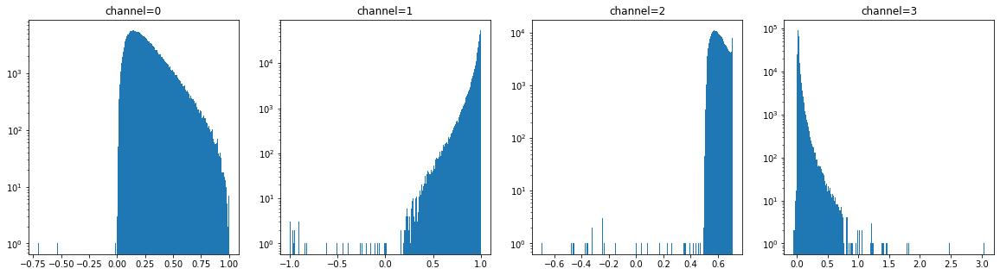

In [20]:
display_datapoint_hists_per_channel(train_ds[0])

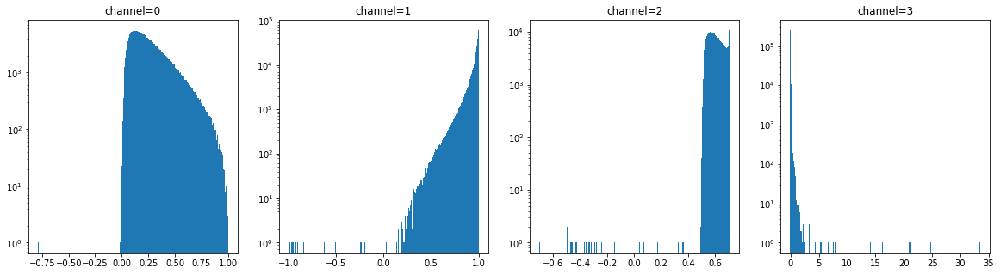

In [21]:
display_datapoint_hists_per_channel(train_ds[10])

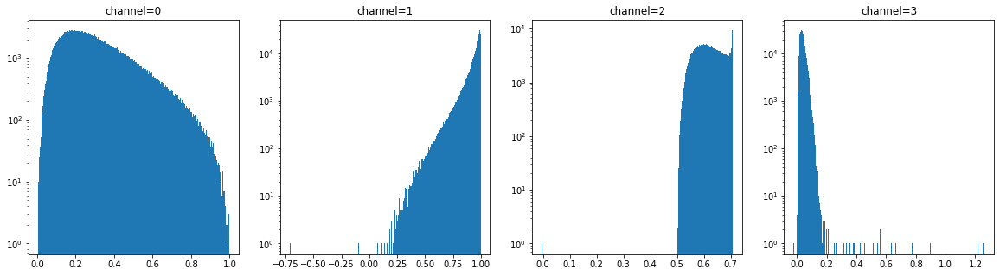

In [22]:
display_datapoint_hists_per_channel(train_ds[100])

Dataloader and visualization

In [10]:
from dataflow.dataloaders import get_train_val_loaders, get_train_sampler

In [11]:
from dataflow.vis import make_grid

import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

In [17]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_img_size = 320

mean = (0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
std = (1.0, 1.0, 1.0, 1.0, 1.0, 1.0)
max_value = 100.0


train_transforms = A.Compose([
    A.RandomCrop(train_img_size, train_img_size),
    A.OneOf([
        A.RandomRotate90(),
        A.Flip(),        
    ]),
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])


val_transforms = A.Compose([
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])

In [18]:
train_sampler = get_train_sampler(train_ds, weight_per_class=(0.7, 0.3))

In [19]:
!ls /tmp/unosat

'train_sampler_weights_6198__[0.5_0.5].pth'
'train_sampler_weights_6231__(0.65_0.35).pth'
'train_sampler_weights_6231__(0.7_0.3).pth'
'train_sampler_weights_6231__(0.9_0.1).pth'


In [20]:
train_loader, val_loader, train_eval_loader = get_train_val_loaders(
    train_ds,
    val_ds,
    train_transforms=train_transforms,
    val_transforms=val_transforms,
    batch_size=4,
    num_workers=10,
    val_batch_size=4,
    train_sampler=train_sampler
)

In [21]:
train_loader_iter = iter(train_loader)
val_loader_iter = iter(val_loader)
train_eval_loader_iter = iter(train_eval_loader)

Train loader

In [22]:
batch = next(train_loader_iter)

In [23]:
batch['image'].max(), batch['image'].min()

(tensor(77.6782), tensor(-2.2165))

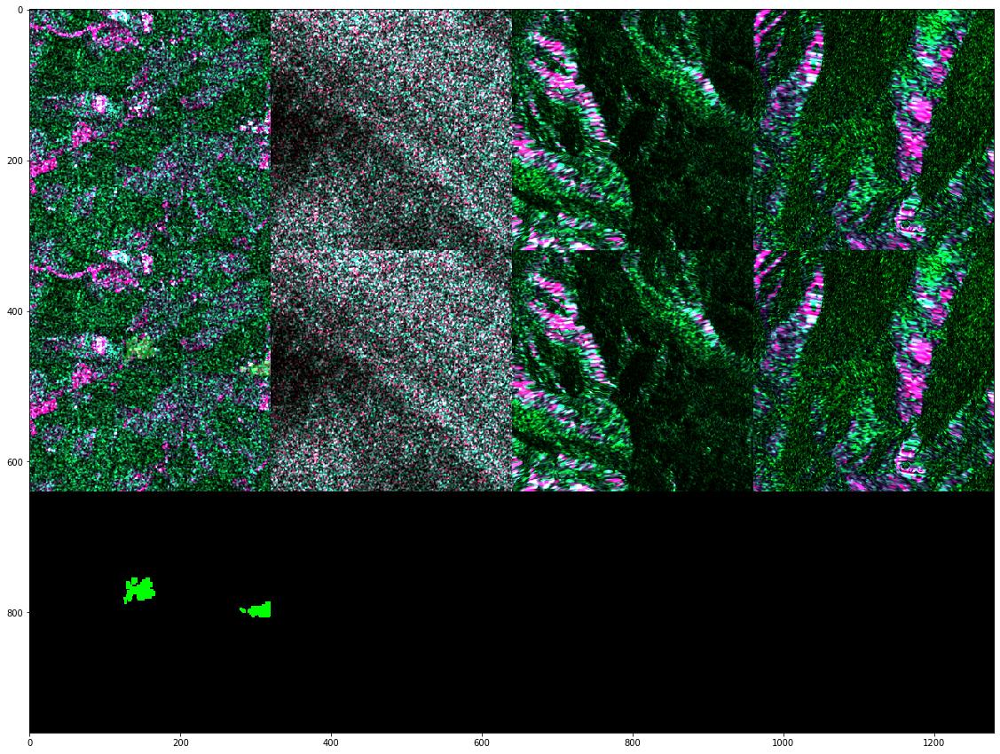

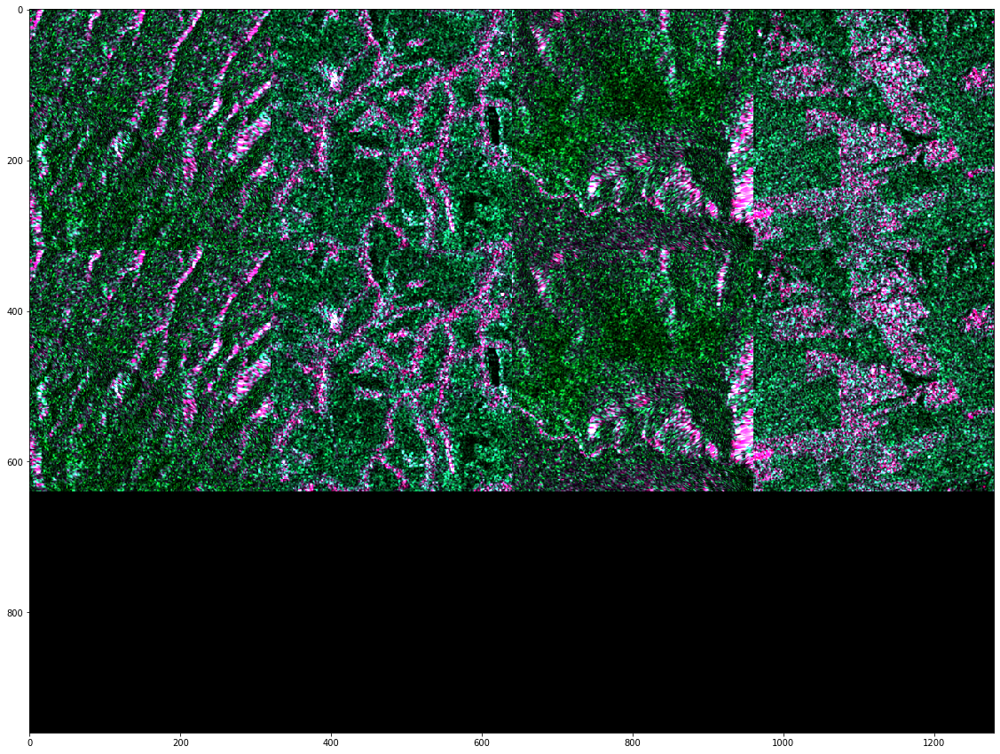

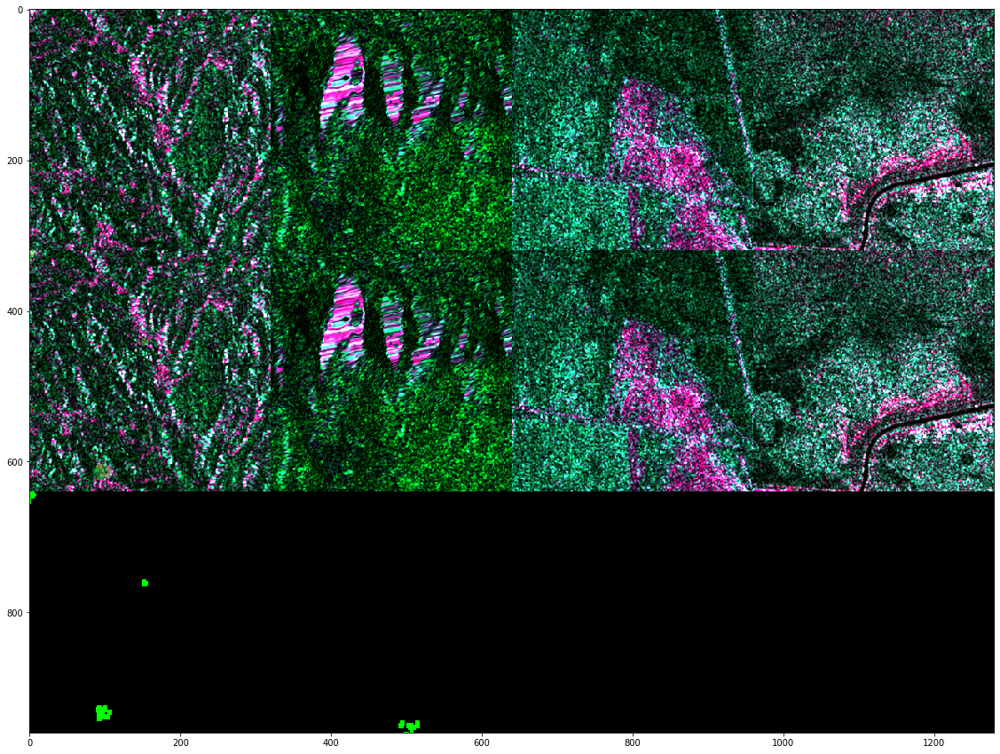

In [25]:
from functools import partial


for _ in range(3):
    batch = next(train_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, (3, 4, 5), :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

Val loader

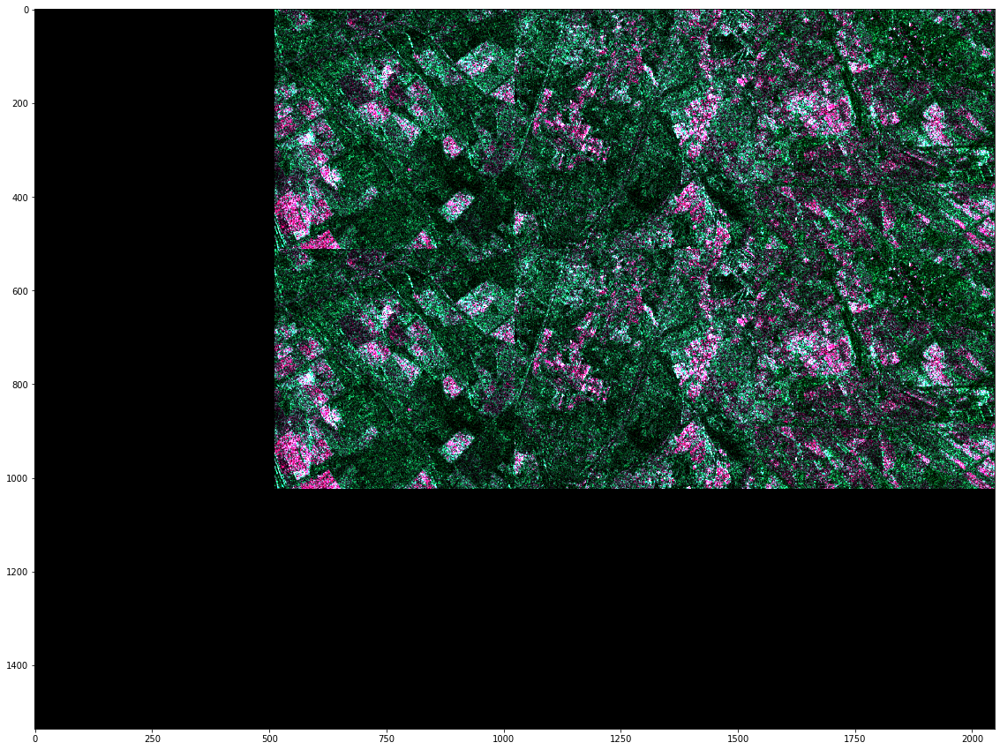

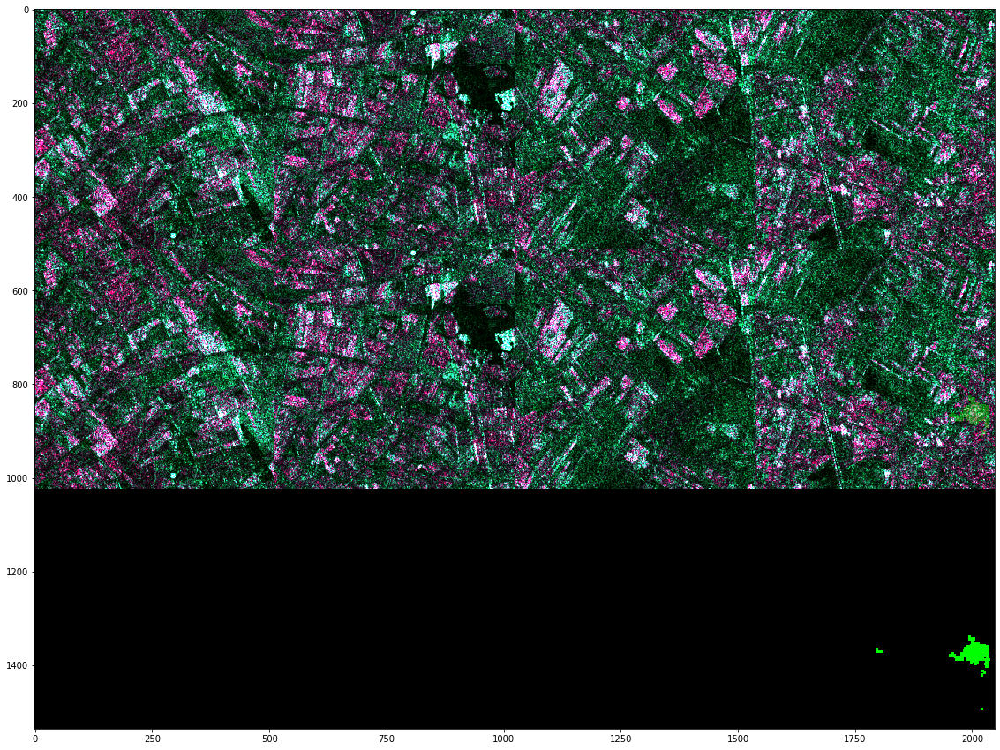

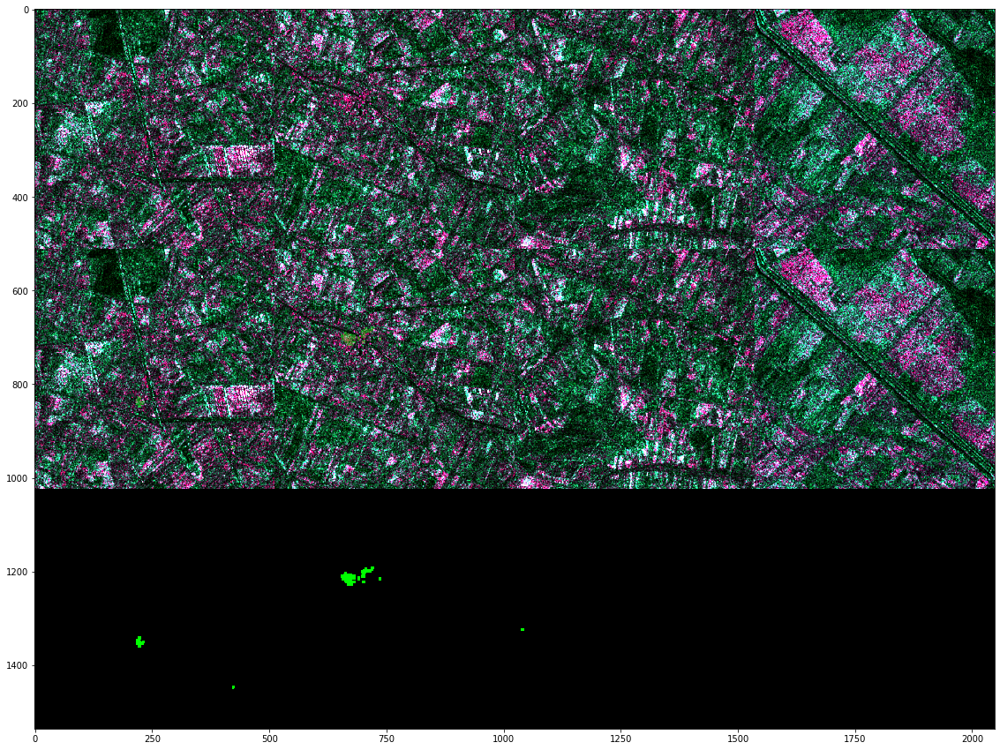

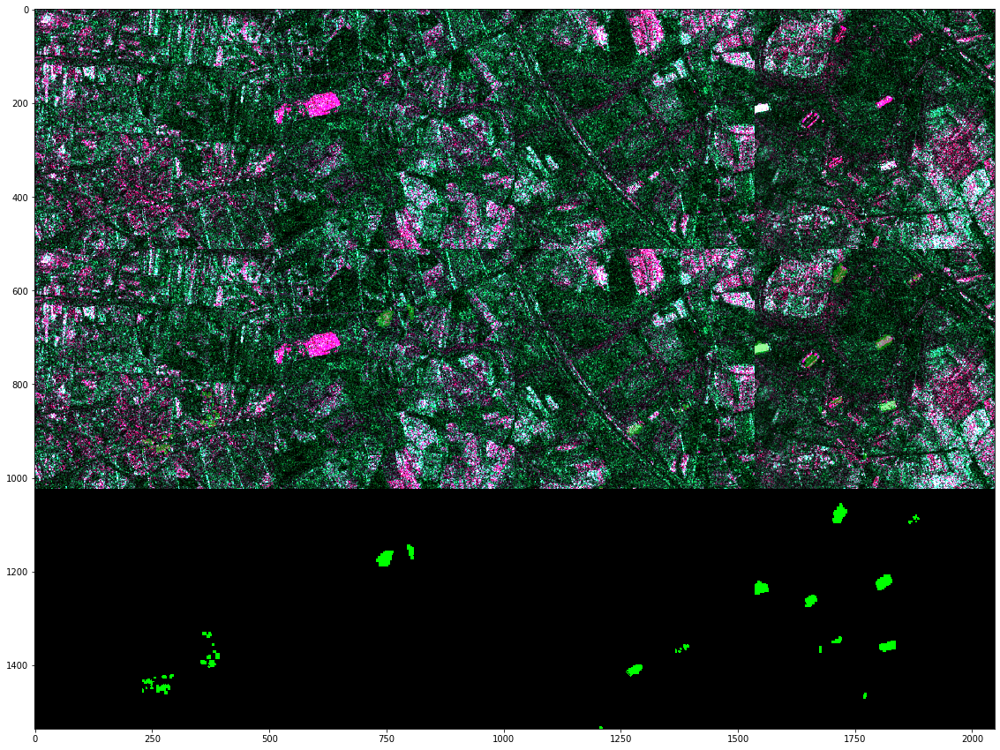

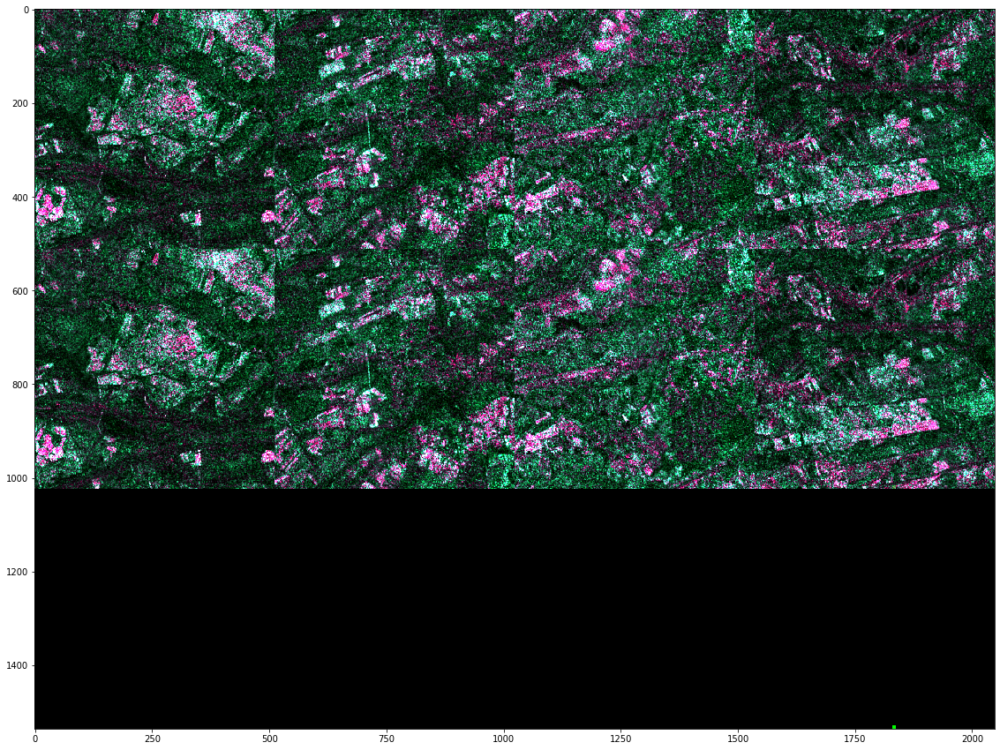

In [26]:
from functools import partial


for _ in range(5):
    batch = next(val_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, (3, 4, 5), :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)